Train Epoch: 0 	Model: 0 	Training Loss: 1034.6628663736979 	Training BPD: 1.8929202159245808
Train Epoch: 0 	Model: 1 	Training Loss: 934.3603035481771 	Training BPD: 1.7021299765904745
Train Epoch: 0 	Model: 2 	Training Loss: 928.5440882161458 	Training BPD: 1.6903407510121664
Train Epoch: 0 	Model: 3 	Training Loss: 964.7404332682291 	Training BPD: 1.7592785860697429
Train Epoch: 0 	Model: 4 	Training Loss: 901.6790745442709 	Training BPD: 1.6421149867375693
Train Epoch: 1 	Model: 0 	Training Loss: 818.0454410807291 	Training BPD: 1.494942094484965
Train Epoch: 1 	Model: 1 	Training Loss: 739.0013240559896 	Training BPD: 1.3405951754252117
Train Epoch: 1 	Model: 2 	Training Loss: 734.8080071614584 	Training BPD: 1.333256089846293
Train Epoch: 1 	Model: 3 	Training Loss: 740.0476684570312 	Training BPD: 1.3426250451405843
Train Epoch: 1 	Model: 4 	Training Loss: 721.1139928385417 	Training BPD: 1.3085400149027506
Train Epoch: 2 	Model: 0 	Training Loss: 728.8029095052083 	Training BP

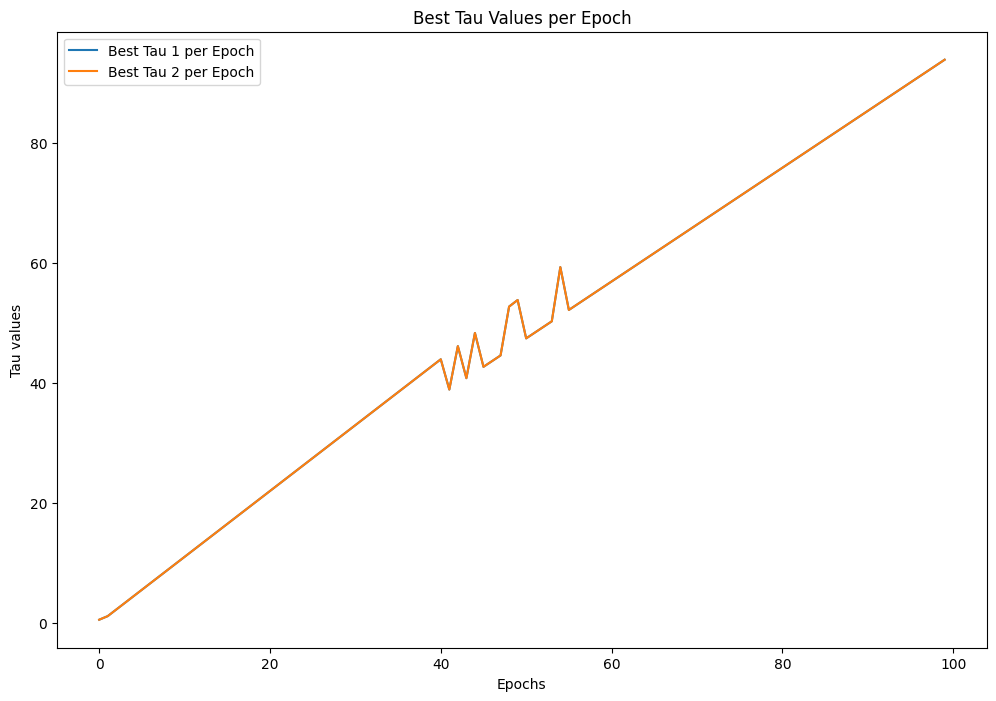

In [ ]:
# Our proposed model 100 epochs training on MNIST (anomaly detection) V3
# digits 2 and 3 are anomaly numbers
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import copy
import numpy as np
import os
import torch.nn.functional as F
import torch.utils.data.dataloader as dataloader
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch import optim
from torch.utils import data as dataloader


# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
LOG_INTERVAL = 50


# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Download and load the MNIST dataset
train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# Remove digits 2 and 3 from the training dataset
train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# # Remove digits 2 and 3 from the test dataset
# test_dataset.data = test_dataset.data[(test_dataset.targets != 2) & (test_dataset.targets != 3)]
# test_dataset.targets = test_dataset.targets[(test_dataset.targets != 2) & (test_dataset.targets != 3)]

# Create new data loaders after removing digits 2 and 3
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)



def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy().squeeze()
    reconstructed_images = reconstructed_images.cpu().detach().numpy().squeeze()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()



# Define the GumbelSoftmaxVAE model
class GumbelSoftmaxVAE(nn.Module):
    def __init__(self, tau_1=1.0, tau_2=1.0):
        super().__init__()

        self.tau_1 = tau_1
        self.tau_2 = tau_2

        # Encoder
        self.conv1 = nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 4 * 4, Z_DIM)
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 4 * 4)
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 8 * 8)

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z


    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 4, 4)  # reshape
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.tanh(self.conv_trans4_1(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 8, 8)  # reshape
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Clamp the values of recon_x between 0 and 1
        recon_x = torch.clamp(recon_x, 0, 1)
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss,dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss


initial_tau_1 = 1.0
initial_tau_2 = 1.0
NUM_EPOCHS = 100
LOG_INTERVAL = 50
import numpy as np
NUM_MODELS = 5
import copy
LOSS_THRESHOLD = 0.0001

# Initialize models and optimizers
models = [GumbelSoftmaxVAE().to(device) for _ in range(NUM_MODELS)]
optimizers = [optim.Adam(model.parameters(), lr=1e-3) for model in models]

# Calculate the decay rates for tau_1 and tau_2 for each model
decay_rates_1 = np.linspace(0.999 - (0.5 / NUM_MODELS), 0.999 + (0.5 / NUM_MODELS), NUM_MODELS)
decay_rates_2 = np.linspace(0.999 - (0.5 / NUM_MODELS), 0.999 + (0.5 / NUM_MODELS), NUM_MODELS)

best_tau_per_epoch_1 = []  # To record the best tau_1 for each epoch
best_tau_per_epoch_2 = []  # To record the best tau_2 for each epoch

for epoch in range(NUM_EPOCHS):
    losses = []
    bpds = []
    best_reconstruction = None  # Keep track of the best reconstruction
    original_images = None

    for i in range(NUM_MODELS):
        models[i].tau_1 = nn.Parameter(torch.tensor(max(initial_tau_1 * (decay_rates_1[i] * epoch), 0.5)), requires_grad=True)
        models[i].tau_2 = nn.Parameter(torch.tensor(max(initial_tau_2 * (decay_rates_2[i] * epoch), 0.5)), requires_grad=True)

        epoch_loss = 0.0
        epoch_bpd = 0.0

        for batch_idx, (data, _) in enumerate(train_loader):
            data = data.to(device)
            optimizers[i].zero_grad()
            recon_batch, logits_z1, logits_z2, z1, z2 = models[i](data)
            loss = models[i].gumbel_softmax_loss_function(recon_batch, data, logits_z1, logits_z2, z1, z2)
            loss.backward()
            optimizers[i].step()

            epoch_loss += loss.item()

            # Compute the BPD
            xent_loss = F.binary_cross_entropy(recon_batch, data, reduction='none')
            xent_loss = torch.sum(xent_loss, dim=[1, 2, 3])
            bpd = torch.mean(xent_loss) / (1 * 28 * 28 * np.log(2))
            epoch_bpd += bpd.item()

            if epoch_loss < LOSS_THRESHOLD and (best_reconstruction is None or loss.item() < min(losses)):
                best_reconstruction = recon_batch  # Save the best reconstruction so far
                original_images = data  # Save the original images for plotting

        # Average loss and BPD over all batches
        epoch_loss /= len(train_loader)
        epoch_bpd /= len(train_loader)

        print(f'Train Epoch: {epoch} \tModel: {i} \tTraining Loss: {epoch_loss} \tTraining BPD: {epoch_bpd}')
        losses.append(epoch_loss)
        bpds.append(epoch_bpd)

    # Select the model with the lowest loss and record the tau
    best_model_idx = np.argmin(losses)
    best_tau_per_epoch_1.append(models[best_model_idx].tau_1.item())
    best_tau_per_epoch_2.append(models[best_model_idx].tau_2.item())

    # Only copy the best model's parameters to all the other models if its loss is below the threshold
    if min(losses) < LOSS_THRESHOLD:
        best_model_state_dict = copy.deepcopy(models[best_model_idx].state_dict())
        for i in range(NUM_MODELS):
            if i != best_model_idx:
                models[i].load_state_dict(best_model_state_dict)
                # Update the tau values as they are not part of the state_dict
                models[i].tau_1 = models[best_model_idx].tau_1
                models[i].tau_2 = models[best_model_idx].tau_2

    # Display the best reconstruction image along with the original image
    if best_reconstruction is not None and original_images is not None:
        plot_images(original_images.cpu(), best_reconstruction.cpu())

# Output the best tau for each epoch
for epoch, (tau_1, tau_2) in enumerate(zip(best_tau_per_epoch_1, best_tau_per_epoch_2)):
    print(f"Epoch: {epoch}, Best Tau 1: {tau_1}, Best Tau 2: {tau_2}")

# Plot the best_tau_per_epoch
plt.figure(figsize=(12, 8))
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_1, label='Best Tau 1 per Epoch')
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_2, label='Best Tau 2 per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Tau values')
plt.title('Best Tau Values per Epoch')
plt.legend()
plt.show()

In [ ]:
# save best model V3
torch.save(models[best_model_idx].state_dict(), 'best_model_mnistv3.pth')
# Our parallel GS-VAE trained 50 epochs for a linear increasing temperature strategy
print(best_tau_per_epoch_1)
print(best_tau_per_epoch_2)

[0.5, 1.099, 2.198, 3.2969999999999997, 4.396, 5.495, 6.593999999999999, 7.693, 8.792, 9.891, 10.99, 12.089, 13.187999999999999, 14.286999999999999, 15.386, 16.485, 17.584, 18.683, 19.782, 20.881, 21.98, 23.079, 24.178, 25.277, 26.375999999999998, 27.474999999999998, 28.573999999999998, 29.673, 30.772, 31.871, 32.97, 34.069, 35.168, 36.266999999999996, 37.366, 38.464999999999996, 39.564, 40.663, 41.762, 42.861, 43.96, 38.909000000000006, 46.158, 40.807, 48.356, 42.705000000000005, 43.654, 44.603, 52.751999999999995, 53.851, 47.45, 48.399, 49.348000000000006, 50.297000000000004, 59.346, 52.195, 53.144000000000005, 54.093, 55.042, 55.99100000000001, 56.940000000000005, 57.889, 58.838, 59.787000000000006, 60.736000000000004, 61.685, 62.63400000000001, 63.583000000000006, 64.53200000000001, 65.48100000000001, 66.43, 67.379, 68.328, 69.277, 70.226, 71.17500000000001, 72.12400000000001, 73.07300000000001, 74.022, 74.971, 75.92, 76.869, 77.81800000000001, 78.76700000000001, 79.71600000000001,

In [ ]:
# load my parallel GS-VAEs on MNIST reconstruction of unseen digits (2s and 3s)
model = GumbelSoftmaxVAE().to(device)  # move to GPU
model.load_state_dict(torch.load('/content/best_model_mnistv3.pth'))


<All keys matched successfully>

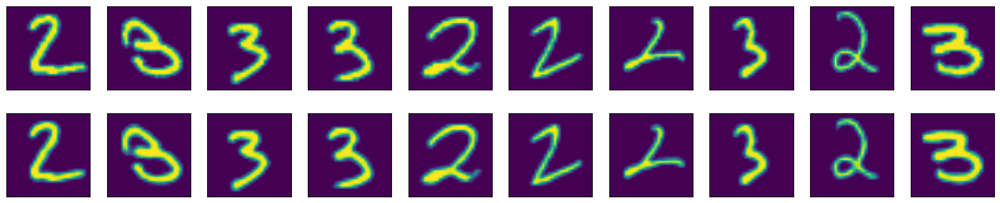

In [ ]:
# Results of my parallel GS-VAEs on MNIST reconstruction of unseen digits (2s and 3s)
def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy()
    reconstructed_images = reconstructed_images.cpu().detach().numpy()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

# Function to filter out only the digits 2 and 3
def filter_2_and_3(data, target):
    mask = (target == 2) | (target == 3)
    return data[mask], target[mask]

# Choose a random batch of images from the test dataset
data, targets = next(iter(test_loader))
data, targets = data.to(device), targets.to(device)

# Filter out only the digits 2 and 3
data, targets = filter_2_and_3(data, targets)

# Pass the images through the best model
# recon_batch, _, _, _, _ = models[best_model_idx](data)
recon_batch, _, _, _, _ = models[best_model_idx](data)
# Plot the original and reconstructed images
plot_images(data.cpu(), recon_batch.cpu())


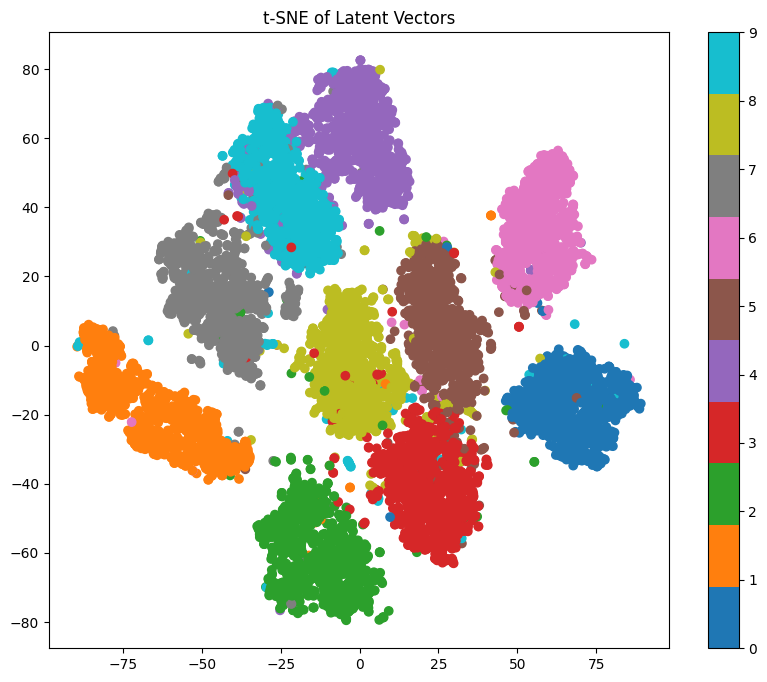

In [ ]:
import torch
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np
batch_size = 128

def get_latent_vectors(model, data):
    with torch.no_grad():
        _, _, _, _, z = model(data)
        return z


all_latent_vectors = []
all_labels = []


for data, labels in test_loader:
    data = data.to(device)
    latent_vectors = get_latent_vectors(model, data).cpu().detach().numpy()
    all_latent_vectors.append(latent_vectors)
    all_labels.append(labels.numpy())

    if len(all_latent_vectors) * batch_size > 10000:
        break


all_latent_vectors = np.concatenate(all_latent_vectors, axis=0)
all_labels = np.concatenate(all_labels, axis=0)


tsne = TSNE(n_components=2, random_state=0)
all_latent_tsne = tsne.fit_transform(all_latent_vectors)


plt.figure(figsize=(10, 8))
plt.scatter(all_latent_tsne[:, 0], all_latent_tsne[:, 1], c=all_labels, cmap='tab10')
plt.colorbar()
plt.title('t-SNE of Latent Vectors')
plt.show()


100%|██████████| 9912422/9912422 [00:00<00:00, 360903404.06it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 43371175.73it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 90325880.90it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 3503867.72it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw

Train Epoch: 0 	Model: 0 	Training Loss: 932.1472486979167 	Training BPD: 1.70580251121521
Train Epoch: 1 	Model: 0 	Training Loss: 771.3732202148437 	Training BPD: 1.4091790075302124
Train Epoch: 2 	Model: 0 	Training Loss: 755.6985654296875 	Training BPD: 1.3806014963785807
Train Epoch: 3 	Model: 0 	Training Loss: 746.5112026367187 	Training BPD: 1.363883716583252
Train Epoch: 4 	Model: 0 	Training Loss: 737.0638553059896 	Training BPD: 1.3467074483235677
Train Epoch: 5 	Model: 0 	Training Loss: 730.702037109375 	Training BPD: 1.3351393435796102
Train Epoch: 6 	Model: 0 	Training Loss: 725.7791712239583 	Training BPD: 1.3261893266042073
Train Epoch: 7 	Model: 0 	Training Loss: 722.3673284505209 	Training BPD: 1.3199603627522787
Train Epoch: 8 	Model: 0 	Training Loss: 718.4302736002604 	Training BPD: 1.3128173049290974
Train Epoch: 9 	Model: 0 	Training Loss: 715.0763579101563 	Training BPD: 1.3067074495951334

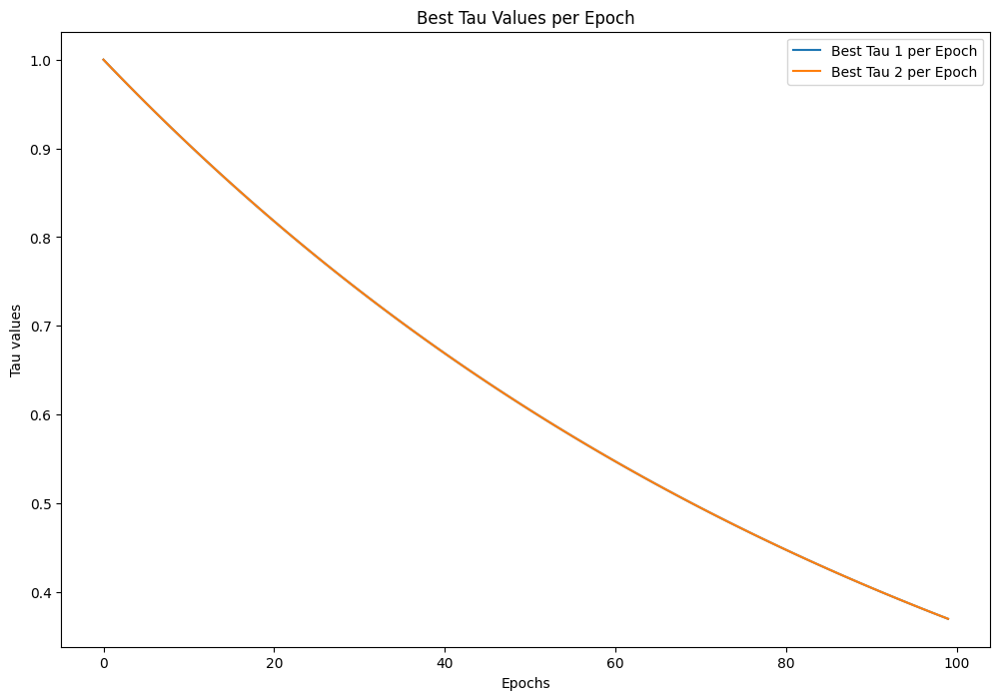

In [ ]:
# My standard GS-VAE trained on MNIST without digits 2 and 3
# My standard GS-VAE has two layers (two taus)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import copy
import numpy as np
import os
import torch.nn.functional as F
import torch.utils.data.dataloader as dataloader
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch import optim
from torch.utils import data as dataloader


# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
LOG_INTERVAL = 50


# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Download and load the MNIST dataset
train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# Remove digits 2 and 3 from the training dataset
train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# # Remove digits 2 and 3 from the test dataset
# test_dataset.data = test_dataset.data[(test_dataset.targets != 2) & (test_dataset.targets != 3)]
# test_dataset.targets = test_dataset.targets[(test_dataset.targets != 2) & (test_dataset.targets != 3)]

# Create new data loaders after removing digits 2 and 3
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)



def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy().squeeze()
    reconstructed_images = reconstructed_images.cpu().detach().numpy().squeeze()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()



# Define the GumbelSoftmaxVAE model
class GumbelSoftmaxVAE(nn.Module):
    def __init__(self, tau_1=1.0, tau_2=1.0):
        super().__init__()

        self.tau_1 = tau_1
        self.tau_2 = tau_2

        # Encoder
        self.conv1 = nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 4 * 4, Z_DIM)
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 4 * 4)
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 8 * 8)

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z


    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 4, 4)  # reshape
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.tanh(self.conv_trans4_1(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 8, 8)  # reshape
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Clamp the values of recon_x between 0 and 1
        recon_x = torch.clamp(recon_x, 0, 1)
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss,dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss


initial_tau_1 = 1.0
initial_tau_2 = 1.0
NUM_EPOCHS = 100
LOG_INTERVAL = 50
import numpy as np
NUM_MODELS = 1 # only let one model to train
import copy
LOSS_THRESHOLD = 0.0001

# Initialize models and optimizers
models = [GumbelSoftmaxVAE().to(device) for _ in range(NUM_MODELS)]
optimizers = [optim.Adam(model.parameters(), lr=1e-3) for model in models]
best_tau_per_epoch_1 = []  # To record the best tau_1 for each epoch
best_tau_per_epoch_2 = []  # To record the best tau_2 for each epoch

decay_factor = 0.99  # Decay factor

tau_1 = initial_tau_1
tau_2 = initial_tau_2

for epoch in range(NUM_EPOCHS):
    losses = []
    bpds = []
    best_reconstruction = None  # Keep track of the best reconstruction
    original_images = None

    for i in range(NUM_MODELS):
        models[i].tau_1 = nn.Parameter(torch.tensor(tau_1), requires_grad=True)
        models[i].tau_2 = nn.Parameter(torch.tensor(tau_2), requires_grad=True)

        epoch_loss = 0.0
        epoch_bpd = 0.0

        for batch_idx, (data, _) in enumerate(train_loader):
            data = data.to(device)
            optimizers[i].zero_grad()
            recon_batch, logits_z1, logits_z2, z1, z2 = models[i](data)
            loss = models[i].gumbel_softmax_loss_function(recon_batch, data, logits_z1, logits_z2, z1, z2)
            loss.backward()
            optimizers[i].step()

            epoch_loss += loss.item()

            # Compute the BPD
            xent_loss = F.binary_cross_entropy(recon_batch, data, reduction='none')
            xent_loss = torch.sum(xent_loss, dim=[1, 2, 3])
            bpd = torch.mean(xent_loss) / (1 * 28 * 28 * np.log(2))
            epoch_bpd += bpd.item()

            if epoch_loss < LOSS_THRESHOLD and (best_reconstruction is None or loss.item() < min(losses)):
                best_reconstruction = recon_batch  # Save the best reconstruction so far
                original_images = data  # Save the original images for plotting

        # Average loss and BPD over all batches
        epoch_loss /= len(train_loader)
        epoch_bpd /= len(train_loader)

        print(f'Train Epoch: {epoch} \tModel: {i} \tTraining Loss: {epoch_loss} \tTraining BPD: {epoch_bpd}')
        losses.append(epoch_loss)
        bpds.append(epoch_bpd)

    # Select the model with the lowest loss and record the tau
    best_model_idx = np.argmin(losses)
    best_tau_per_epoch_1.append(models[best_model_idx].tau_1.item())
    best_tau_per_epoch_2.append(models[best_model_idx].tau_2.item())

    # Update tau values for the next epoch
    tau_1 *= decay_factor
    tau_2 *= decay_factor

    # Only copy the best model's parameters to all the other models if its loss is below the threshold
    if min(losses) < LOSS_THRESHOLD:
        best_model_state_dict = copy.deepcopy(models[best_model_idx].state_dict())
        for i in range(NUM_MODELS):
            if i != best_model_idx:
                models[i].load_state_dict(best_model_state_dict)
                # Update the tau values as they are not part of the state_dict
                models[i].tau_1 = models[best_model_idx].tau_1
                models[i].tau_2 = models[best_model_idx].tau_2

    # Display the best reconstruction image along with the original image
    if best_reconstruction is not None and original_images is not None:
        plot_images(original_images.cpu(), best_reconstruction.cpu())

# Output the best tau for each epoch
for epoch, (tau_1, tau_2) in enumerate(zip(best_tau_per_epoch_1, best_tau_per_epoch_2)):
    print(f"Epoch: {epoch}, Best Tau 1: {tau_1}, Best Tau 2: {tau_2}")

# Plot the best_tau_per_epoch
plt.figure(figsize=(12, 8))
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_1, label='Best Tau 1 per Epoch')
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_2, label='Best Tau 2 per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Tau values')
plt.title('Best Tau Values per Epoch')
plt.legend()
plt.show()

# save best model my way to decrease tau v4
torch.save(models[best_model_idx].state_dict(), 'best_model_Mnistv4.pth')

In [ ]:
model = GumbelSoftmaxVAE().to(device)  # move to GPU
model.load_state_dict(torch.load('/content/best_model_Mnistv4.pth'))

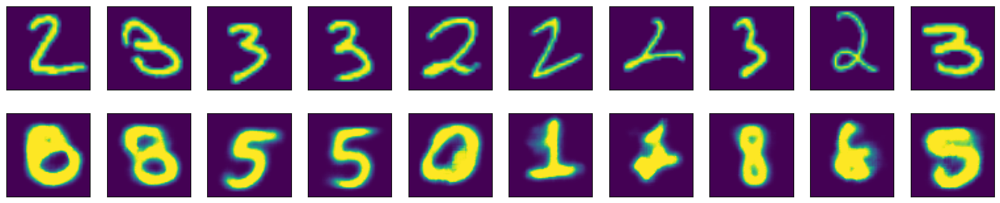

In [ ]:
# Function to plot images anomaly numbers 2 and 3
def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy()
    reconstructed_images = reconstructed_images.cpu().detach().numpy()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i].transpose(1, 2, 0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

# Function to filter out only the digits 2 and 3
def filter_2_and_3(data, target):
    mask = (target == 2) | (target == 3)
    return data[mask], target[mask]

# Choose a random batch of images from the test dataset
data, targets = next(iter(test_loader))
data, targets = data.to(device), targets.to(device)

# Filter out only the digits 2 and 3
data, targets = filter_2_and_3(data, targets)

# Pass the images through the best model
# recon_batch, _, _, _, _ = models[best_model_idx](data)
recon_batch, _, _, _, _ = model(data)
# Plot the original and reconstructed images
plot_images(data.cpu(), recon_batch.cpu())


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


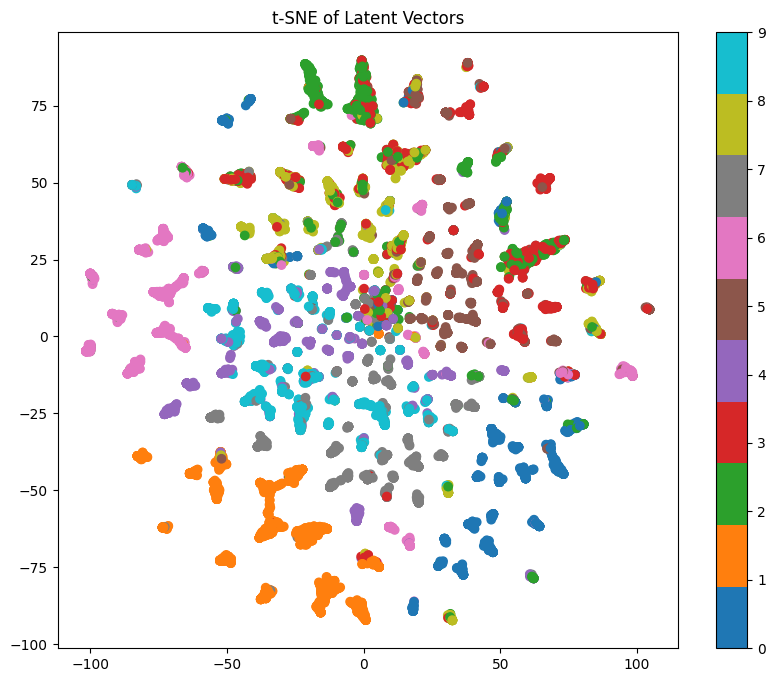

In [ ]:
# regular proposed model
import torch
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np
batch_size = 128

def get_latent_vectors(model, data):
    with torch.no_grad():
        _, _, _, _, z = model(data)
        return z

all_latent_vectors = []
all_labels = []


for data, labels in test_loader:
    data = data.to(device)
    latent_vectors = get_latent_vectors(model2, data).cpu().detach().numpy()
    all_latent_vectors.append(latent_vectors)
    all_labels.append(labels.numpy())

    if len(all_latent_vectors) * batch_size > 10000:
        break


all_latent_vectors = np.concatenate(all_latent_vectors, axis=0)
all_labels = np.concatenate(all_labels, axis=0)


tsne = TSNE(n_components=2, random_state=0)
all_latent_tsne = tsne.fit_transform(all_latent_vectors)


plt.figure(figsize=(10, 8))
plt.scatter(all_latent_tsne[:, 0], all_latent_tsne[:, 1], c=all_labels, cmap='tab10')
plt.colorbar()
plt.title('t-SNE of Latent Vectors')
plt.show()


In [ ]:
# Standard Gaussian VAE in reconstruction of MNIST unseen digits task
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt


Z_DIM = 20
BATCH_SIZE = 128
LEARNING_RATE = 0.001
NUM_EPOCHS = 30
TAU = 1.0
TAU_DECAY = 0.95
MIN_TAU = 0.1
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])


train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]


train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

class GumbelVAE(nn.Module):
    def __init__(self):
        super(GumbelVAE, self).__init__()

        # Encoder layers
        self.fc1 = nn.Linear(64 * 64, 512)
        self.fc_bn1 = nn.BatchNorm1d(512)
        self.fc2 = nn.Linear(512, 256)
        self.fc_bn2 = nn.BatchNorm1d(256)
        self.fc3 = nn.Linear(256, Z_DIM)

        # Decoder layers
        self.fc4 = nn.Linear(Z_DIM, 256)
        self.fc_bn3 = nn.BatchNorm1d(256)
        self.fc5 = nn.Linear(256, 512)
        self.fc_bn4 = nn.BatchNorm1d(512)
        self.fc6 = nn.Linear(512, 64 * 64)

    def encode(self, x):
        h1 = F.relu(self.fc_bn1(self.fc1(x)))
        h2 = F.relu(self.fc_bn2(self.fc2(h1)))
        return self.fc3(h2)

    def reparameterize(self, logits, tau):
        z = F.gumbel_softmax(logits, tau=tau, hard=False)
        return z

    def decode(self, z):
        h3 = F.relu(self.fc_bn3(self.fc4(z)))
        h4 = F.relu(self.fc_bn4(self.fc5(h3)))
        return torch.sigmoid(self.fc6(h4))

    def forward(self, x, tau):
        logits = self.encode(x.view(-1, 64 * 64))
        z = self.reparameterize(logits, tau)
        return self.decode(z), logits


def gumbel_vae_loss_function(recon_x, x, logits):
    BCE = F.binary_cross_entropy(recon_x, x.view(-1, 64 * 64), reduction='sum')
    KLD = -0.5 * torch.sum(1 + logits - logits.pow(2) - logits.exp())
    return BCE + KLD


def train_gumbel_vae(model, optimizer, data_loader, tau):
    model.train()
    train_loss = 0
    for batch_idx, (data, _) in enumerate(data_loader):
        data = data.to(DEVICE)
        optimizer.zero_grad()
        recon_batch, logits = model(data, tau)
        loss = gumbel_vae_loss_function(recon_batch, data, logits)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()
    avg_loss = train_loss / len(data_loader.dataset)
    return avg_loss


def test_gumbel_vae(model, data_loader, tau):
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for data, _ in data_loader:
            data = data.to(DEVICE)
            recon_batch, logits = model(data, tau)
            test_loss += gumbel_vae_loss_function(recon_batch, data, logits).item()
    avg_loss = test_loss / len(data_loader.dataset)
    return avg_loss


gumbel_vae = GumbelVAE().to(DEVICE)
optimizer = torch.optim.Adam(gumbel_vae.parameters(), lr=LEARNING_RATE)


for epoch in range(NUM_EPOCHS):
    train_loss = train_gumbel_vae(gumbel_vae, optimizer, train_loader, TAU)
    test_loss = test_gumbel_vae(gumbel_vae, test_loader, TAU)
    print(f'Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}')
    TAU = max(TAU * TAU_DECAY, MIN_TAU)


data, _ = next(iter(test_loader))
data = data.to(DEVICE)
with torch.no_grad():
    recon_batch, _ = gumbel_vae(data, TAU)



Epoch 1, Train Loss: 923.6085, Test Loss: 911.3483
Epoch 2, Train Loss: 836.2793, Test Loss: 885.8546
Epoch 3, Train Loss: 819.8393, Test Loss: 874.3046
Epoch 4, Train Loss: 809.8753, Test Loss: 861.8154
Epoch 5, Train Loss: 801.5201, Test Loss: 857.9333
Epoch 6, Train Loss: 795.3591, Test Loss: 852.4177
Epoch 7, Train Loss: 794.2639, Test Loss: 849.1700
Epoch 8, Train Loss: 794.3409, Test Loss: 851.3912
Epoch 9, Train Loss: 796.2840, Test Loss: 849.2942
Epoch 10, Train Loss: 799.5290, Test Loss: 854.9804
Epoch 11, Train Loss: 802.0458, Test Loss: 855.0677
Epoch 12, Train Loss: 806.7254, Test Loss: 863.3074
Epoch 13, Train Loss: 811.5781, Test Loss: 869.3323
Epoch 14, Train Loss: 815.7012, Test Loss: 873.0760
Epoch 15, Train Loss: 819.6873, Test Loss: 879.1055
Epoch 16, Train Loss: 824.9470, Test Loss: 887.5486
Epoch 17, Train Loss: 829.5552, Test Loss: 891.5851
Epoch 18, Train Loss: 833.7275, Test Loss: 894.5923
Epoch 19, Train Loss: 838.4039, Test Loss: 916.5799
Epoch 20, Train Loss:

In [ ]:
#save model
torch.save(gumbel_vae.state_dict(), 'Gaussian_vae_model.pth')

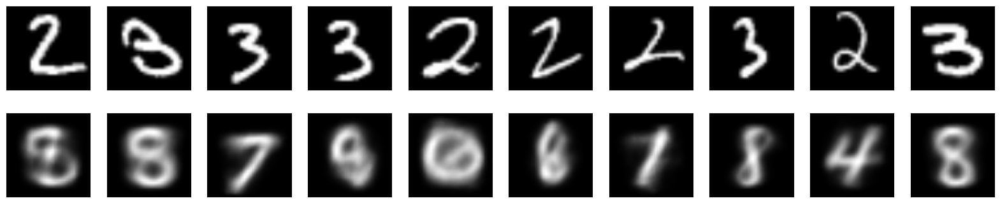

In [ ]:
# load standard Gaussian VAE to reconstruct digits
# because this model has been not trained with 2s and 3s, the reconstruction is poor

train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# Filtering the test dataset for digits 2 and 3
test_indices = (test_dataset.targets == 2) | (test_dataset.targets == 3)
test_dataset.data = test_dataset.data[test_indices]
test_dataset.targets = test_dataset.targets[test_indices]

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)



model = GumbelVAE().to(device)  # move to GPU
model.load_state_dict(torch.load('/content/Gaussian_vae_model.pth'))

data, _ = next(iter(test_loader))
data = data.to(DEVICE)
with torch.no_grad():
    recon_batch, _ = gumbel_vae(data, TAU)


def plot_images(original_images, reconstructed_images, n=10):
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i][0].cpu(), cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstructed images
        ax = plt.subplot(2, n, i + 1 + n)
        recon_image = reconstructed_images[i].view(64, 64).cpu()  # Reshape the tensor to 64x64
        plt.imshow(recon_image, cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

plot_images(data.cpu(), recon_batch.cpu(), n=10)

In [ ]:
# Load models on MNIST
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import copy
import torch.nn.functional as F
import numpy as np
import os
import torch.utils.data.dataloader as dataloader
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch import optim
from torch.utils import data as dataloader
from torchvision import transforms

# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
LOG_INTERVAL = 50

# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Download and load the MNIST dataset
train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# Remove digits 2 and 3 from the training dataset
train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# # Remove digits 2 and 3 from the test dataset
# test_dataset.data = test_dataset.data[(test_dataset.targets != 2) & (test_dataset.targets != 3)]
# test_dataset.targets = test_dataset.targets[(test_dataset.targets != 2) & (test_dataset.targets != 3)]

# Create new data loaders after removing digits 2 and 3
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


class GumbelSoftmaxVAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Define tau_1 and tau_2 as nn.Parameter
        self.tau_1 = nn.Parameter(torch.tensor(1.0))
        self.tau_2 = nn.Parameter(torch.tensor(1.0))

        # Encoder
        self.conv1 = nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 4 * 4, Z_DIM)
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 4 * 4)
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 8 * 8)

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z


    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 4, 4)  # reshape
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.tanh(self.conv_trans4_1(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 8, 8)  # reshape
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Clamp the values of recon_x between 0 and 1
        recon_x = torch.clamp(recon_x, 0, 1)
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss,dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss
model = GumbelSoftmaxVAE().to(device)  # move to GPU
model.load_state_dict(torch.load('/content/sample_data/best_model_mnist_regular.pth')) # the model trained by our proposed parallel framework and the dataset without 2s and 3s
model1 = GumbelSoftmaxVAE().to(device)  # move to GPU
model1.load_state_dict(torch.load('/content/sample_data/best_model_mnistv4.pth')) # the model trained by a increasing temperature strategy (no parallel models) and the dataset without 2s and 3s
model2 = GumbelSoftmaxVAE().to(device)
model2.load_state_dict(torch.load('/content/sample_data/best_model_mnistv_real_regular.pth')) # the model trained by regular decy temperature strategy and the dataset without 2s and 3s
model3 = GumbelSoftmaxVAE().to(device)
model3.load_state_dict(torch.load('/content/sample_data/best_model_mnistv_full_m5.pth')) # the model trained by our proposed parallel framework and the full dataset

100%|██████████| 9912422/9912422 [00:00<00:00, 163642025.64it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 26646655.04it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 80014478.23it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 3157197.34it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



<All keys matched successfully>

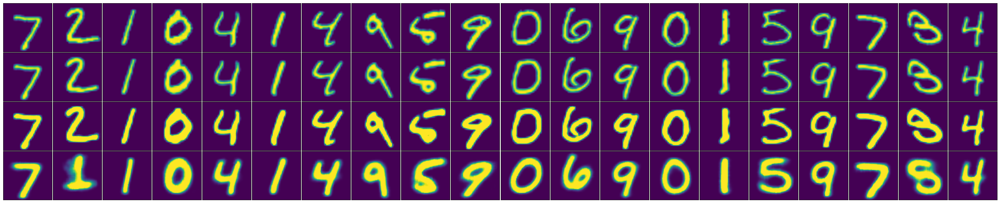

In [ ]:
# Test the models trained by the dataset without 2s and 3s
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

epsilon = 0.00

data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)


model.eval()
model1.eval()
model2.eval()


data.requires_grad = True
reconstructed_images = model(data)[0]
loss = F.mse_loss(reconstructed_images, data)


model.zero_grad()
loss.backward()

data_grad = data.grad.data


perturbed_data = fgsm_attack(data, epsilon, data_grad)


recon_batch_model = model(perturbed_data)[0] # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
recon_batch_model1 = model1(perturbed_data)[0] # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
recon_batch_model2 = model2(perturbed_data)[0] # the model trained by regular decy temperature strategy and the dataset without 2s and 3s


plt.figure(figsize=(40, 8))
for i in range(20):

    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_model[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(recon_batch_model1[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    ax = plt.subplot(4, 20, i + 61)
    plt.imshow(recon_batch_model2[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()


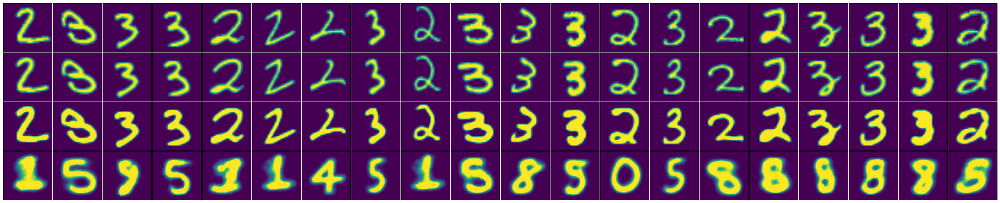

In [ ]:
# Compare the reconstruction of the models trained without 2s and 3s
def add_white_bar_to_images(images, bar_width, bar_height, start_x, start_y):
    modified_images = images.clone()
    modified_images[:, :, start_y:start_y+bar_height, start_x:start_x+bar_width] = 1.0
    return modified_images

# Parameters for the white bar
bar_width = 20
bar_height = 10
start_x = 30
start_y = 30

# Choose a random batch of images from the test dataset
def filter_2_and_3(data, target):
    mask = (target == 2) | (target == 3)
    return data[mask], target[mask]

# Choose a random batch of images from the test dataset
data, targets = next(iter(test_loader))
data, targets = data.to(device), targets.to(device)

# Filter out only the digits 2 and 3
data, targets = filter_2_and_3(data, targets)

# Pass the images through the models
recon_batch_model, _, _, _, _ = model(data)  # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
recon_batch_model1, _, _, _, _ = model1(data) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
recon_batch_model2, _, _, _, _ = model2(data) # the model trained by regular decy temperature strategy and the dataset without 2s and 3s

# Plot the original images and their reconstructions
plt.figure(figsize=(40, 8))
for i in range(20):  # Loop over 20 images
    # Display original images
    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(data[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images using model1
    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(recon_batch_model1[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images using model
    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_model[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images using model2
    ax = plt.subplot(4, 20, i + 61)
    plt.imshow(recon_batch_model2[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()


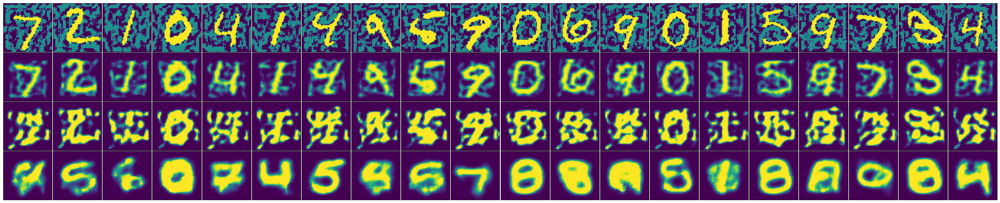

In [ ]:
# Test the models performance for reconstruction under high-intensity FGSM adversarial attacks
# The models were trained by the dataset without 2s and 3s
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Download and load the MNIST dataset
train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# FGSM attack function
def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

epsilon = 0.5

data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)

model.eval()
model1.eval()
model2.eval()
data.requires_grad = True
reconstructed_images = model(data)[0]

loss = F.mse_loss(reconstructed_images, data)
model.zero_grad()
loss.backward()

data_grad = data.grad.data

perturbed_data = fgsm_attack(data, epsilon, data_grad)
recon_batch_model = model(perturbed_data)[0]
recon_batch_model1 = model1(perturbed_data)[0]
recon_batch_model2 = model2(perturbed_data)[0]

plt.figure(figsize=(40, 8))
for i in range(20):

    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_model[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(recon_batch_model1[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    ax = plt.subplot(4, 20, i + 61)
    plt.imshow(recon_batch_model2[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()


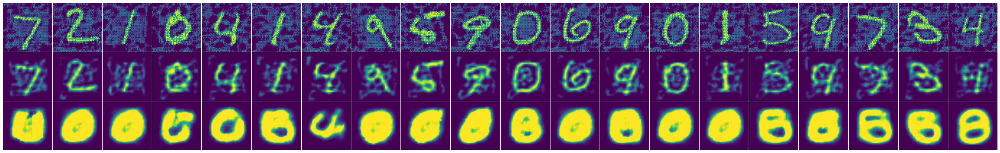

In [ ]:
# Test the models performance for reconstruction under high-intensity FGSM adversarial attacks
# Compare the models were trained by the dataset without 2s and 3s
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

def iterative_fgsm_attack(image, epsilon, model, iters=40):
    perturbed_image = image.clone().detach().to(device).requires_grad_(True)
    for _ in range(iters):
        output = model(perturbed_image)
        loss = F.mse_loss(output[0], image)
        model.zero_grad()
        loss.backward()
        perturbed_image = perturbed_image + epsilon * perturbed_image.grad.sign()
        perturbed_image = torch.clamp(perturbed_image, 0, 1).detach_()
        perturbed_image.requires_grad_(True)
    return perturbed_image

# Set epsilon for the FGSM attack
epsilon = 0.5 / 40  # Adjust epsilon for iterative approach

# Load a batch of images
data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)

# Set models to evaluation mode
model.eval()
model1.eval()
model3.eval()

# Make a copy of the data to avoid modifying it during the attack
original_data = data.clone().detach().requires_grad_(True)

# Perform the attack
perturbed_data = iterative_fgsm_attack(original_data, epsilon, model, iters=40)

# Get the reconstructions from the models
recon_batch_model = model(perturbed_data)[0]
recon_batch_model2 = model2(perturbed_data)[0] # the model trained by regular decy temperature strategy and the dataset without 2s and 3s
recon_batch_model3 = model3(perturbed_data)[0] # the model trained by our proposed parallel framework and the dataset without 2s and 3s

# Plot the results
plt.figure(figsize=(40, 8))
for i in range(20):
    # Original perturbed images
    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(perturbed_data[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images from model
    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(recon_batch_model3[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # # Reconstructed images from model1
    # ax = plt.subplot(4, 20, i + 41)
    # plt.imshow(recon_batch_model[i].cpu().detach().numpy().transpose(1, 2, 0))
    # ax.axis('off')

    # Reconstructed images from model2
    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_model2[i].cpu().detach().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()


In [ ]:
# Train a simple CNN to classify the reconstruction images
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.dropout = nn.Dropout(0.2)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


train_dataset = datasets.MNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST('./data', train=False, transform=transform, download=True)


BATCH_SIZE = 64
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)


optimizer = optim.Adam(model.parameters(), lr=0.001)


def train_model(model, train_loader, optimizer, num_epochs):
    model.train()
    for epoch in range(num_epochs):
        for data, target in train_loader:
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = F.cross_entropy(output, target)
            loss.backward()
            optimizer.step()
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}")


def test_model(model, test_loader, epoch, best_accuracy):
    model.eval()
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
    accuracy = 100. * correct / len(test_loader.dataset)
    print(f"Epoch {epoch}, Test Accuracy: {accuracy:.2f}%")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        torch.save(model.state_dict(), 'best_CNN_model.pth')
        print(f"New best model saved with accuracy: {accuracy:.2f}%")
    return best_accuracy

NUM_EPOCHS = 20
best_accuracy = 0.0

for epoch in range(NUM_EPOCHS):
    train_model(model, train_loader, optimizer, epoch)
    best_accuracy = test_model(model, test_loader, epoch, best_accuracy)


Epoch 0, Test Accuracy: 8.92%
New best model saved with accuracy: 8.92%
Epoch 1/1, Loss: 0.027020737528800964
Epoch 1, Test Accuracy: 98.48%
New best model saved with accuracy: 98.48%
Epoch 1/2, Loss: 0.03288428112864494
Epoch 2/2, Loss: 0.21655665338039398
Epoch 2, Test Accuracy: 98.97%
New best model saved with accuracy: 98.97%
Epoch 1/3, Loss: 0.09413958340883255
Epoch 2/3, Loss: 0.05595872178673744
Epoch 3/3, Loss: 0.032397545874118805
Epoch 3, Test Accuracy: 99.08%
New best model saved with accuracy: 99.08%
Epoch 1/4, Loss: 0.012783261016011238
Epoch 2/4, Loss: 0.0001445758098270744
Epoch 3/4, Loss: 0.006445846054702997
Epoch 4/4, Loss: 0.0009062073659151793
Epoch 4, Test Accuracy: 99.22%
New best model saved with accuracy: 99.22%
Epoch 1/5, Loss: 0.0004909502458758652
Epoch 2/5, Loss: 0.14797194302082062
Epoch 3/5, Loss: 0.0005096757668070495
Epoch 4/5, Loss: 0.0012208258267492056
Epoch 5/5, Loss: 0.00031690337345935404
Epoch 5, Test Accuracy: 99.19%
Epoch 1/6, Loss: 0.0006545249

KeyboardInterrupt: 

In [ ]:
# Use the trained CNN to predict reconstructed pure images
import torch
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision.transforms.functional as TF


best_model_path = '/content/best_CNN_model.pth'
cnn_model = CNN().to(device)
cnn_model.load_state_dict(torch.load(best_model_path))
cnn_model.eval()


def resize_images(images, size=(28, 28)):
    resized_images = torch.stack([TF.resize(image, size) for image in images])
    return resized_images


def evaluate(model, data_loader, cnn_model):
    correct = 0
    total = 0
    with torch.no_grad():
        for data, target in data_loader:
            data, target = data.to(device), target.to(device)
            reconstructed_images = model(data)[0]
            resized_images = resize_images(reconstructed_images)
            outputs = cnn_model(resized_images)
            _, predicted = torch.max(outputs.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()
    accuracy = 100 * correct / total
    return accuracy

accuracy_model = evaluate(model, test_loader, cnn_model) # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
accuracy_model1 = evaluate(model1, test_loader, cnn_model) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
accuracy_model2 = evaluate(model2, test_loader, cnn_model) # the model trained by regular decy temperature strategy and the dataset without 2s and 3s

print(f"Model Accuracy: {accuracy_model:.2f}%")
print(f"Model1 Accuracy: {accuracy_model1:.2f}%") # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
print(f"Model2 Accuracy: {accuracy_model2:.2f}%")

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Model Accuracy: 53.46%
Model1 Accuracy: 97.12%
Model2 Accuracy: 20.53%


In [ ]:
# Use the trained CNN to predict reconstructed attacked images by FGSM attacks
def pgd_attack(model, image, epsilon, alpha, iters, target):
    perturbed_image = image.clone()
    perturbed_image.requires_grad = True

    for _ in range(iters):
        outputs = model(perturbed_image)[0]
        loss = F.mse_loss(outputs, image)
        model.zero_grad()
        loss.backward()
        data_grad = perturbed_image.grad.data

        # Call FGSM Attack
        sign_data_grad = data_grad.sign()
        perturbed_image = perturbed_image + alpha * sign_data_grad
        perturbed_image = torch.clamp(perturbed_image, 0, 1)

        # Re-evaluate the perturbed image, ensuring it does not drift too far from the original
        eta = torch.clamp(perturbed_image - image, min=-epsilon, max=epsilon)
        perturbed_image = torch.clamp(image + eta, 0, 1).detach_()
        perturbed_image.requires_grad = True

    return perturbed_image

# Define PGD attack parameters
epsilon = 0.1 # Maximum perturbation
alpha = 0.01  # Step size
iters = 40    # Number of iterations

# Get some test data
data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)

# PGD attack
perturbed_data = pgd_attack(model, data, epsilon, alpha, iters, target)

recon_batch_model = model(perturbed_data)[0]
recon_batch_model1 = model1(perturbed_data)[0]
recon_batch_model2 = model2(perturbed_data)[0]

best_model_path = '/content/sample_data/best_CNN_model.pth'
cnn_model = CNN().to(device)
cnn_model.load_state_dict(torch.load(best_model_path))
cnn_model.eval()

def resize_images(images, size=(28, 28)):
    resized_images = torch.stack([TF.resize(image, size) for image in images])
    return resized_images

def evaluate(model, data, cnn_model):
    correct = 0
    total = 0
    with torch.no_grad():
        reconstructed_images = model(data)[0]
        resized_images = resize_images(reconstructed_images)
        outputs = cnn_model(resized_images)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
    accuracy = 100 * correct / total
    return accuracy

accuracy_model = evaluate(model, perturbed_data, cnn_model) # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
accuracy_model1 = evaluate(model1, perturbed_data, cnn_model) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
accuracy_model2 = evaluate(model2, perturbed_data, cnn_model) # the model trained by regular decy temperature strategy and the dataset without 2s and 3s

print(f"Model Accuracy: {accuracy_model:.2f}%")
print(f"Model1 Accuracy: {accuracy_model1:.2f}%")
print(f"Model2 Accuracy: {accuracy_model2:.2f}%")



Model Accuracy: 12.50%
Model1 Accuracy: 95.31%
Model2 Accuracy: 23.44%


In [ ]:
# Use the trained CNN to predict reconstructed attacked images by FGSM attacks
import torch
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt

def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

epsilon = 0.6

data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)


model.eval()
model1.eval()
model2.eval()

data.requires_grad = True
reconstructed_images = model(data)[0]
loss = F.mse_loss(reconstructed_images, data)
model.zero_grad()
loss.backward()
data_grad = data.grad.data
perturbed_data = fgsm_attack(data, epsilon, data_grad)


recon_batch_model = model(perturbed_data)[0]
recon_batch_model1 = model1(perturbed_data)[0]
recon_batch_model2 = model2(perturbed_data)[0]

best_model_path = '/content/sample_data/best_CNN_model.pth'
cnn_model = CNN().to(device)
cnn_model.load_state_dict(torch.load(best_model_path))
cnn_model.eval()


def resize_images(images, size=(28, 28)):
    resized_images = torch.stack([TF.resize(image, size) for image in images])
    return resized_images


def evaluate(model, data, cnn_model):
    correct = 0
    total = 0
    with torch.no_grad():
        reconstructed_images = model(data)[0]
        resized_images = resize_images(reconstructed_images)
        outputs = cnn_model(resized_images)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
    accuracy = 100 * correct / total
    return accuracy


accuracy_model = evaluate(model, perturbed_data, cnn_model) # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
accuracy_model1 = evaluate(model1, perturbed_data, cnn_model) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
accuracy_model3 = evaluate(model3, perturbed_data, cnn_model) # the model trained by our proposed parallel framework and the dataset without 2s and 3s


print(f"Model Accuracy: {accuracy_model:.2f}%")
print(f"Model1 Accuracy: {accuracy_model1:.2f}%")
print(f"Model3 Accuracy: {accuracy_model3:.2f}%")


Model Accuracy: 13.28%
Model1 Accuracy: 78.91%
Model3 Accuracy: 82.03%


In [ ]:
# Use the trained CNN to predict reconstructed attacked images by PGD attacks
# Model 3 is trained by our proposed parallel framework and the full dataset
import torch
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt

def pgd_attack(model, images, labels, eps, alpha, iters):
    original_images = images.clone().detach()
    perturbed_images = original_images.clone().detach()

    for _ in range(iters):
        perturbed_images.requires_grad = True
        outputs = model(perturbed_images)[0]

        model.zero_grad()
        loss = F.mse_loss(outputs, perturbed_images)
        loss.backward()

        adv_images = perturbed_images + alpha * perturbed_images.grad.sign()
        eta = torch.clamp(adv_images - original_images, min=-eps, max=eps)
        perturbed_images = torch.clamp(original_images + eta, 0, 1).detach_()

    return perturbed_images

epsilon = 0.5
alpha = 0.01
iters = 40

data, target = next(iter(test_loader))
data, target = data.to(device), target.to(device)

model.eval()
model1.eval()
model2.eval()
model3.eval()

perturbed_data = pgd_attack(model, data, target, epsilon, alpha, iters)


def resize_images(images, size=(28, 28)):
    resized_images = torch.stack([TF.to_tensor(TF.resize(TF.to_pil_image(image), size)) for image in images])
    return resized_images


def evaluate(model, data, cnn_model):
    correct = 0
    total = 0
    with torch.no_grad():
        reconstructed_images = model(data)[0]
        resized_images = resize_images(reconstructed_images).to(device)  # Move to GPU
        outputs = cnn_model(resized_images)
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()
    accuracy = 100 * correct / total
    return accuracy


accuracy_model = evaluate(model, perturbed_data, cnn_model) # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
accuracy_model1 = evaluate(model1, perturbed_data, cnn_model) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
accuracy_model3 = evaluate(model3, perturbed_data, cnn_model) # the model trained by our proposed parallel framework and the full dataset

print(f"Model Accuracy: {accuracy_model:.2f}%")
print(f"Model1 Accuracy: {accuracy_model1:.2f}%")
print(f"Model3 Accuracy: {accuracy_model3:.2f}%")


Model Accuracy: 11.72%
Model1 Accuracy: 92.19%
Model3 Accuracy: 95.31%


In [ ]:
# Compare the models for reconstruction metrics MSE
# The models were trained by using the datasets without 2s and 3s
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from skimage.metrics import structural_similarity as ssim

def calculate_mse(image1, image2):
    return ((image1 - image2) ** 2).mean().item()

def calculate_ssim(image1, image2):
    image1_np = image1.cpu().detach().permute(1, 2, 0).numpy()
    image2_np = image2.cpu().detach().permute(1, 2, 0).numpy()
    return ssim(image1_np, image2_np, multichannel=True)


data, _ = next(iter(test_loader))
data = data.to(device)

recon_batch_model, _, _, _, _ = model(data)
recon_batch_model1, _, _, _, _ = model1(data)
recon_batch_model2, _, _, _, _ = model2(data)

mse_scores_model = []
ssim_scores_model = []
mse_scores_model1 = []
ssim_scores_model1 = []
mse_scores_model2 = []
ssim_scores_model2 = []

for i in range(len(data)):
    mse_scores_model.append(calculate_mse(data[i], recon_batch_model[i]))
    ssim_scores_model.append(calculate_ssim(data[i], recon_batch_model[i]))
    mse_scores_model1.append(calculate_mse(data[i], recon_batch_model1[i]))
    ssim_scores_model1.append(calculate_ssim(data[i], recon_batch_model1[i]))
    mse_scores_model2.append(calculate_mse(data[i], recon_batch_model2[i]))
    ssim_scores_model2.append(calculate_ssim(data[i], recon_batch_model2[i]))


avg_mse_model = np.mean(mse_scores_model) # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
avg_ssim_model = np.mean(ssim_scores_model)
avg_mse_model1 = np.mean(mse_scores_model1) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
avg_ssim_model1 = np.mean(ssim_scores_model1)
avg_mse_model2 = np.mean(mse_scores_model2) # the model trained by regular decy temperature strategy and the dataset without 2s and 3s
avg_ssim_model2 = np.mean(ssim_scores_model2)

print("Model MSE:", avg_mse_model)
print("Model SSIM:", avg_ssim_model)
print("Model1 MSE:", avg_mse_model1)
print("Model1 SSIM:", avg_ssim_model1)
print("Model2 MSE:", avg_mse_model2)
print("Model2 SSIM:", avg_ssim_model2)


<ipython-input-3-fd85a53245bc>:15: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(image1_np, image2_np, multichannel=True)


Model MSE: 0.015469119629415218
Model SSIM: 0.90906024
Model1 MSE: 0.0004091689765459705
Model1 SSIM: 0.9939371
Model2 MSE: 0.026793922756041866
Model2 SSIM: 0.7220049


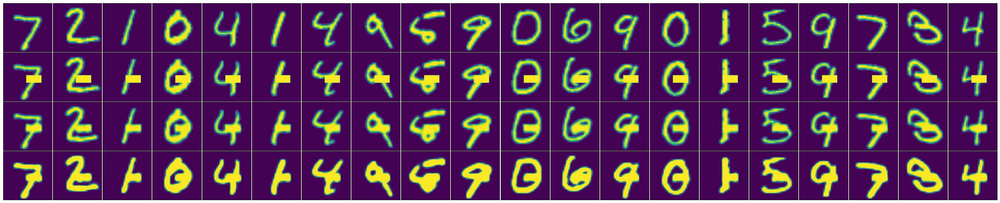

In [ ]:
# Test reconstruction of the models under a patch attack
def add_white_bar_to_images(images, bar_width, bar_height, start_x, start_y):
    modified_images = images.clone()
    modified_images[:, :, start_y:start_y+bar_height, start_x:start_x+bar_width] = 1.0
    return modified_images

# Parameters for the white bar
bar_width = 20
bar_height = 10
start_x = 30
start_y = 30

# Choose a random batch of images from the test dataset
data, _ = next(iter(test_loader))
data = data.to(device)

# Add white bar to the images
data_with_bar = add_white_bar_to_images(data, bar_width, bar_height, start_x, start_y)

# Pass the images with the white bar through the model
recon_batch_with_bar, _, _, _, _ = model(data_with_bar)  # the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
recon_batch_with_bar1, _, _, _, _ = model1(data_with_bar) # the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s

# Plot the original images, images with the white bar, and their reconstructions
plt.figure(figsize=(40, 8))
for i in range(20):  # Now we loop over 20 images
    # Display original images
    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(data[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display images with the white bar
    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(data_with_bar[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions by the model trained by increasing temperature strategy (parallel models) and the dataset without 2s and 3s
    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_with_bar1[i].detach().cpu().numpy().transpose(1, 2, 0))  # Use .detach() here
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions by the model trained by a increasing temperature strategy but without a parallel framework and the dataset without 2s and 3s
    ax = plt.subplot(4, 20, i + 61)
    plt.imshow(recon_batch_with_bar[i].detach().cpu().numpy().transpose(1, 2, 0))  # Use .detach() here
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()

Train Epoch: 0 	Model: 0 	Training Loss: 1664.8989739583333 	Training BPD: 3.051594821929932
Train Epoch: 1 	Model: 0 	Training Loss: 1533.440986328125 	Training BPD: 2.8096017513275147
Train Epoch: 2 	Model: 0 	Training Loss: 1494.1319290364584 	Training BPD: 2.73853072420756
Train Epoch: 3 	Model: 0 	Training Loss: 1457.1125745442707 	Training BPD: 2.6709879144032795
Train Epoch: 4 	Model: 0 	Training Loss: 1423.4828785807292 	Training BPD: 2.6095525442759198
Train Epoch: 5 	Model: 0 	Training Loss: 1396.89214453125 	Training BPD: 2.5610564098358153
Train Epoch: 6 	Model: 0 	Training Loss: 1378.85774609375 	Training BPD: 2.5281815045674643
Train Epoch: 7 	Model: 0 	Training Loss: 1366.8057522786457 	Training BPD: 2.5061472098032636
Train Epoch: 8 	Model: 0 	Training Loss: 1358.5822958984375 	Training BPD: 2.4910266240437826
Train Epoch: 9 	Model: 0 	Training Loss: 1352.131987955729 	Training BPD: 2.479112101872762
Train Epoch: 10 	Model: 0 	Training Loss: 1347.4030065104166 	Training

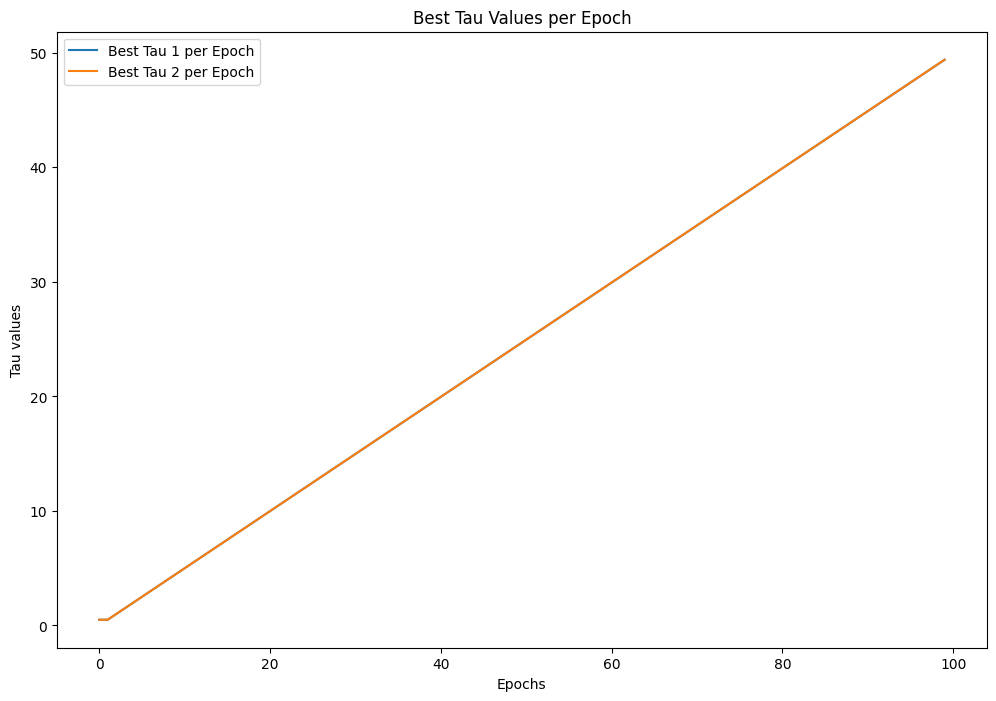

In [ ]:
# The model was trained on fashion MNIST
# Classes 2 and 3 are anomaly unseen categories
# The model adopts the linear increasing temperature strategy for training (without parallel models)
# The following codes can be easily converted to train parallel models by different lienar increasing strategies
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import copy
import torch.nn.functional as F
import os
import torch.utils.data.dataloader as dataloader
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch import optim
from torch.utils import data as dataloader


# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
LOG_INTERVAL = 50


# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])


# Download and load the Fashion-MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# Remove Classes 2 and 3 from the training dataset
train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# # Remove Classes 2 and 3 from the test dataset
# test_dataset.data = test_dataset.data[(test_dataset.targets != 2) & (test_dataset.targets != 3)]
# test_dataset.targets = test_dataset.targets[(test_dataset.targets != 2) & (test_dataset.targets != 3)]

# Create new data loaders after removing Classes 2 and 3
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)



def plot_images(original_images, reconstructed_images, n=10):
    original_images = original_images.cpu().numpy().squeeze()
    reconstructed_images = reconstructed_images.cpu().detach().numpy().squeeze()

    plt.figure(figsize=(20, 4))
    for i in range(n):
        # Display original images
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(original_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # Display reconstruction images
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(reconstructed_images[i], cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()



# Define the GumbelSoftmaxVAE model
class GumbelSoftmaxVAE(nn.Module):
    def __init__(self, tau_1=1.0, tau_2=1.0):
        super().__init__()

        self.tau_1 = tau_1
        self.tau_2 = tau_2

        # Encoder
        self.conv1 = nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 4 * 4, Z_DIM)
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 4 * 4)
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 8 * 8)

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z


    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 4, 4)  # reshape
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.tanh(self.conv_trans4_1(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 8, 8)  # reshape
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Clamp the values of recon_x between 0 and 1
        recon_x = torch.clamp(recon_x, 0, 1)
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss,dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss


initial_tau_1 = 1.0
initial_tau_2 = 1.0
NUM_EPOCHS = 100
LOG_INTERVAL = 50
import numpy as np
NUM_MODELS = 1
import copy
LOSS_THRESHOLD = 0.0001

# Initialize models and optimizers
models = [GumbelSoftmaxVAE().to(device) for _ in range(NUM_MODELS)]
optimizers = [optim.Adam(model.parameters(), lr=1e-3) for model in models]

# Calculate the decay rates for tau_1 and tau_2 for each model
decay_rates_1 = np.linspace(0.999 - (0.5 / NUM_MODELS), 0.999 + (0.5 / NUM_MODELS), NUM_MODELS)
decay_rates_2 = np.linspace(0.999 - (0.5 / NUM_MODELS), 0.999 + (0.5 / NUM_MODELS), NUM_MODELS)

best_tau_per_epoch_1 = []  # To record the best tau_1 for each epoch
best_tau_per_epoch_2 = []  # To record the best tau_2 for each epoch

for epoch in range(NUM_EPOCHS):
    losses = []
    bpds = []
    best_reconstruction = None  # Keep track of the best reconstruction
    original_images = None

    for i in range(NUM_MODELS):
        models[i].tau_1 = nn.Parameter(torch.tensor(max(initial_tau_1 * (decay_rates_1[i] * epoch), 0.5)), requires_grad=True)
        models[i].tau_2 = nn.Parameter(torch.tensor(max(initial_tau_2 * (decay_rates_2[i] * epoch), 0.5)), requires_grad=True)

        epoch_loss = 0.0
        epoch_bpd = 0.0

        for batch_idx, (data, _) in enumerate(train_loader):
            data = data.to(device)
            optimizers[i].zero_grad()
            recon_batch, logits_z1, logits_z2, z1, z2 = models[i](data)
            loss = models[i].gumbel_softmax_loss_function(recon_batch, data, logits_z1, logits_z2, z1, z2)
            loss.backward()
            optimizers[i].step()

            epoch_loss += loss.item()

            # Compute the BPD
            xent_loss = F.binary_cross_entropy(recon_batch, data, reduction='none')
            xent_loss = torch.sum(xent_loss, dim=[1, 2, 3])
            bpd = torch.mean(xent_loss) / (1 * 28 * 28 * np.log(2))
            epoch_bpd += bpd.item()

            if epoch_loss < LOSS_THRESHOLD and (best_reconstruction is None or loss.item() < min(losses)):
                best_reconstruction = recon_batch  # Save the best reconstruction so far
                original_images = data  # Save the original images for plotting

        # Average loss and BPD over all batches
        epoch_loss /= len(train_loader)
        epoch_bpd /= len(train_loader)

        print(f'Train Epoch: {epoch} \tModel: {i} \tTraining Loss: {epoch_loss} \tTraining BPD: {epoch_bpd}')
        losses.append(epoch_loss)
        bpds.append(epoch_bpd)

    # Select the model with the lowest loss and record the tau
    best_model_idx = np.argmin(losses)
    best_tau_per_epoch_1.append(models[best_model_idx].tau_1.item())
    best_tau_per_epoch_2.append(models[best_model_idx].tau_2.item())

    # Only copy the best model's parameters to all the other models if its loss is below the threshold
    if min(losses) < LOSS_THRESHOLD:
        best_model_state_dict = copy.deepcopy(models[best_model_idx].state_dict())
        for i in range(NUM_MODELS):
            if i != best_model_idx:
                models[i].load_state_dict(best_model_state_dict)
                # Update the tau values as they are not part of the state_dict
                models[i].tau_1 = models[best_model_idx].tau_1
                models[i].tau_2 = models[best_model_idx].tau_2

    # Display the best reconstruction image along with the original image
    if best_reconstruction is not None and original_images is not None:
        plot_images(original_images.cpu(), best_reconstruction.cpu())

# Output the best tau for each epoch
for epoch, (tau_1, tau_2) in enumerate(zip(best_tau_per_epoch_1, best_tau_per_epoch_2)):
    print(f"Epoch: {epoch}, Best Tau 1: {tau_1}, Best Tau 2: {tau_2}")

# Plot the best_tau_per_epoch
plt.figure(figsize=(12, 8))
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_1, label='Best Tau 1 per Epoch')
plt.plot(range(NUM_EPOCHS), best_tau_per_epoch_2, label='Best Tau 2 per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Tau values')
plt.title('Best Tau Values per Epoch')
plt.legend()
plt.show()

# save best model
torch.save(models[best_model_idx].state_dict(), 'best_model_mnistv1_fasionMINST_regular.pth')

In [ ]:
# Load the model adopts the linear increasing temperature strategy for training (without parallel models): model
# Load the model adopts the linear increasing temperature strategy for training (with parallel models): model1
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import copy
import torch.nn.functional as F
import os
import torch.utils.data.dataloader as dataloader
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.autograd import Variable
from torchvision import transforms
from torchvision.datasets import CelebA
from torch import optim
from torch.utils import data as dataloader

# Set the random seed and device
SEED = 1
torch.manual_seed(SEED)
cuda = torch.cuda.is_available()
device = torch.device('cuda' if cuda else 'cpu')

# Define constants
BATCH_SIZE = 128
Z_DIM = 300
LOG_INTERVAL = 50


# Define the transform for image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

# Remove digits 2 and 3 from the training dataset
train_dataset.data = train_dataset.data[(train_dataset.targets != 2) & (train_dataset.targets != 3)]
train_dataset.targets = train_dataset.targets[(train_dataset.targets != 2) & (train_dataset.targets != 3)]

# # Remove digits 2 and 3 from the test dataset
# test_dataset.data = test_dataset.data[(test_dataset.targets != 2) & (test_dataset.targets != 3)]
# test_dataset.targets = test_dataset.targets[(test_dataset.targets != 2) & (test_dataset.targets != 3)]

# Create new data loaders after removing digits 2 and 3
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


class GumbelSoftmaxVAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Define tau_1 and tau_2 as nn.Parameter
        self.tau_1 = nn.Parameter(torch.tensor(1.0))
        self.tau_2 = nn.Parameter(torch.tensor(1.0))

        # Encoder
        self.conv1 = nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)

        # Two layers of latent variables
        self.fc_logits_z1 = nn.Linear(256 * 4 * 4, Z_DIM)
        self.fc_logits_z2 = nn.Linear(Z_DIM, Z_DIM)

        # Decoder for each layer
        self.fc_dec1 = nn.Linear(Z_DIM, 256 * 4 * 4)
        self.fc_dec2 = nn.Linear(Z_DIM, 128 * 8 * 8)

        self.conv_trans1_1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans4_1 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

        self.conv_trans1_2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.conv_trans2_2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.conv_trans3_2 = nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1)

    def encode(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = x.view(x.size(0), -1)

        logits_z1 = self.fc_logits_z1(x)
        logits_z2 = self.fc_logits_z2(logits_z1)

        return logits_z1, logits_z2

    def reparameterize(self, logits, tau):
        gumbel_noise = torch.rand_like(logits).to(device)
        gumbel_noise = -torch.log(-torch.log(gumbel_noise + 1e-8) + 1e-8)
        z = (logits + gumbel_noise) / tau
        z = F.softmax(z, dim=-1)
        return z


    def decode1(self, z):
        z = self.fc_dec1(z)
        z = z.view(z.size(0), 256, 4, 4)  # reshape
        z = F.relu(self.conv_trans1_1(z))
        z = F.relu(self.conv_trans2_1(z))
        z = F.relu(self.conv_trans3_1(z))
        z = torch.tanh(self.conv_trans4_1(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def decode2(self, z):
        z = self.fc_dec2(z)
        z = z.view(z.size(0), 128, 8, 8)  # reshape
        z = F.relu(self.conv_trans1_2(z))
        z = F.relu(self.conv_trans2_2(z))
        z = torch.sigmoid(self.conv_trans3_2(z))
        z = torch.clamp(z, 0, 1)  # Clamp the values between 0 and 1
        return z

    def forward(self, x):
        logits_z1, logits_z2 = self.encode(x)
        z1 = self.reparameterize(logits_z1, self.tau_1)
        z2 = self.reparameterize(logits_z2, self.tau_2)

        x_hat1 = self.decode1(z1)
        x_hat2 = self.decode2(z2)

        # Average the output of the two decoders
        x_hat = (x_hat1 + x_hat2) / 2.0

        return x_hat, logits_z1, logits_z2, z1, z2

    def gumbel_softmax_loss_function(self, recon_x, x, logits_z1, logits_z2, z1, z2):
        # Clamp the values of recon_x between 0 and 1
        recon_x = torch.clamp(recon_x, 0, 1)
        # Binary cross entropy
        xent_loss = F.binary_cross_entropy(recon_x, x, reduction='none')
        xent_loss = torch.sum(xent_loss,dim=[1, 2, 3])

        # KL divergence for each layer
        p_z1 = F.softmax(logits_z1, dim=-1)
        p_z1 = torch.clamp(p_z1, torch.finfo(p_z1.dtype).eps, 1. - torch.finfo(p_z1.dtype).eps)  # to prevent log(0)
        kl_loss_z1 = torch.sum(p_z1 * torch.log(p_z1 * Z_DIM + torch.finfo(p_z1.dtype).eps), dim=-1)

        p_z2 = F.softmax(logits_z2, dim=-1)
        p_z2 = torch.clamp(p_z2, torch.finfo(p_z2.dtype).eps, 1. - torch.finfo(p_z2.dtype).eps)  # to prevent log(0)
        kl_loss_z2 = torch.sum(p_z2 * torch.log(p_z2 * Z_DIM + torch.finfo(p_z2.dtype).eps), dim=-1)

        # Total loss is the sum of the losses for each layer
        vae_loss = torch.mean(xent_loss + kl_loss_z1 + kl_loss_z2)
        return vae_loss
model1 = GumbelSoftmaxVAE().to(device)  # move to GPU
model = GumbelSoftmaxVAE().to(device)
model1.load_state_dict(torch.load('/content/sample_data/best_model_mnistv1_fasionMINST.pth'))
model.load_state_dict(torch.load('/content/sample_data/best_model_mnistv1_fasionMINST_regular.pth')) # the model adopts the linear increasing temperature strategy for training (with parallel models): model1

<All keys matched successfully>

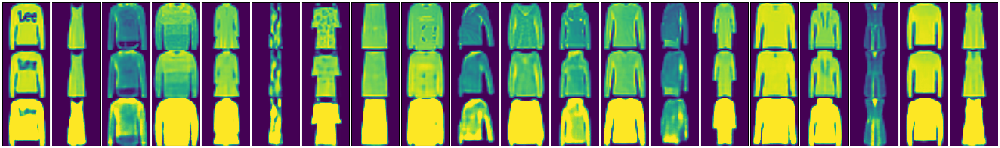

In [ ]:
# Compare the models and verify the parallel frameworks is useful
# The both models attempt to reconstruct the unseen data (class 2 and 3)

# Choose a random batch of images from the test dataset
def filter_2_and_3(data, target):
    mask = (target == 2) | (target == 3)
    return data[mask], target[mask]

# Choose a random batch of images from the test dataset
data, targets = next(iter(test_loader))
data, targets = data.to(device), targets.to(device)

# Filter out only the digits 2 and 3
data, targets = filter_2_and_3(data, targets)

# Pass the images through the model
recon_batch_model, _, _, _, _ = model(data)
recon_batch_model1, _, _, _, _ = model1(data)

# Plot the original images and their reconstructions
plt.figure(figsize=(55, 8))
for i in range(20):  # Loop over 20 images
    # Display original images
    ax = plt.subplot(3, 20, i + 1)
    plt.imshow(data[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images using model
    ax = plt.subplot(3, 20, i + 41)
    plt.imshow(recon_batch_model[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images using model1
    ax = plt.subplot(3, 20, i + 21)
    plt.imshow(recon_batch_model1[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()

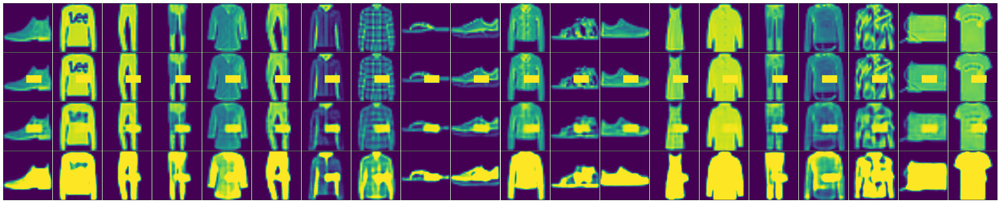

In [ ]:
# Compare the models and verify the parallel frameworks is useful
# The both models attempt to reconstruct the unseen data (class 2 and 3) that are attacked by patches

def add_white_bar_to_images(images, bar_width, bar_height, start_x, start_y):
    modified_images = images.clone()
    modified_images[:, :, start_y:start_y+bar_height, start_x:start_x+bar_width] = 1.0
    return modified_images

# Parameters for the white bar
bar_width = 20
bar_height = 10
start_x = 30
start_y = 30

# Choose a random batch of images from the test dataset
data, _ = next(iter(test_loader))
data = data.to(device)

# Add white bar to the images
data_with_bar = add_white_bar_to_images(data, bar_width, bar_height, start_x, start_y)

# Pass the images with the white bar through the model
recon_batch_with_bar, _, _, _, _ = model(data_with_bar)
recon_batch_with_bar1, _, _, _, _ = model1(data_with_bar)

# Plot the original images, images with the white bar, and their reconstructions
plt.figure(figsize=(40, 8))
for i in range(20):  # Now we loop over 20 images
    # Display original images
    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(data[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display images with the white bar
    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(data_with_bar[i].cpu().numpy().transpose(1, 2, 0))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of original images
    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_with_bar1[i].detach().cpu().numpy().transpose(1, 2, 0))  # Use .detach() here
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstructions of images with the white bar
    ax = plt.subplot(4, 20, i + 61)
    plt.imshow(recon_batch_with_bar[i].detach().cpu().numpy().transpose(1, 2, 0))  # Use .detach() here
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()

Best Anomaly Detection Accuracy: 0.60 at Threshold: 0.00
Image 1: Noise Added: True, Predicted Anomaly: False, Correct: False
Image 2: Noise Added: True, Predicted Anomaly: True, Correct: True
Image 3: Noise Added: False, Predicted Anomaly: False, Correct: True
Image 4: Noise Added: True, Predicted Anomaly: False, Correct: False
Image 5: Noise Added: False, Predicted Anomaly: False, Correct: True
Image 6: Noise Added: False, Predicted Anomaly: False, Correct: True
Image 7: Noise Added: True, Predicted Anomaly: True, Correct: True
Image 8: Noise Added: True, Predicted Anomaly: True, Correct: True
Image 9: Noise Added: True, Predicted Anomaly: False, Correct: False
Image 10: Noise Added: True, Predicted Anomaly: True, Correct: True
Image 11: Noise Added: False, Predicted Anomaly: False, Correct: True
Image 12: Noise Added: True, Predicted Anomaly: True, Correct: True
Image 13: Noise Added: False, Predicted Anomaly: False, Correct: True
Image 14: Noise Added: True, Predicted Anomaly: Fals

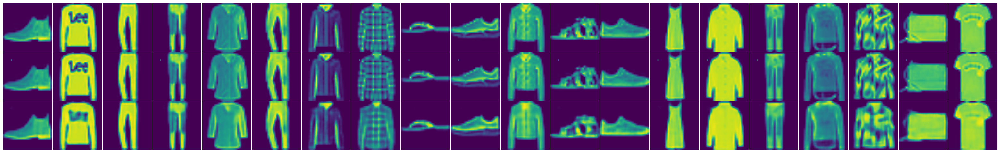

Anomaly Detection Accuracy: 0.60


In [ ]:
# Test the models to detect small-scale patch attacks
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

def add_random_noise_to_images(images, bar_width, bar_height, start_x, start_y, probability=0.5):
    modified_images = images.clone()
    noise_added = np.zeros(images.shape[0], dtype=bool)
    for i in range(images.shape[0]):
        if np.random.rand() < probability:
            modified_images[i, :, start_y:start_y+bar_height, start_x:start_x+bar_width] = 1.0
            noise_added[i] = True
    return modified_images, noise_added

def calculate_reconstruction_error(data, recon_data):
    return F.mse_loss(recon_data, data, reduction='none').mean([1, 2, 3])

# Parameters for noise
bar_width = 1
bar_height = 1
start_x = 10
start_y = 10
noise_probability = 0.5

data, _ = next(iter(test_loader))
data = data.to(device)

data_with_noise, noise_added = add_random_noise_to_images(data, bar_width, bar_height, start_x, start_y, noise_probability)

# our proposed model
recon_batch_with_noise, _, _, _, _ = model1(data_with_noise)

reconstruction_errors = calculate_reconstruction_error(data_with_noise, recon_batch_with_noise)
reconstruction_errors = reconstruction_errors.detach().cpu().numpy()

best_accuracy = 0.0
best_threshold = 0.0

# find best percentile
for percentile in range(50, 100):
    threshold = np.percentile(reconstruction_errors, percentile)
    predicted_anomalies = reconstruction_errors > threshold
    accuracy = (predicted_anomalies == noise_added).mean()

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_threshold = threshold

predicted_anomalies = reconstruction_errors > best_threshold
accuracy = (predicted_anomalies == noise_added).mean()
print(f"Best Anomaly Detection Accuracy: {accuracy:.2f} at Threshold: {best_threshold:.2f}")

for i in range(100):
    print(f"Image {i+1}: Noise Added: {noise_added[i]}, Predicted Anomaly: {predicted_anomalies[i]}, Correct: {noise_added[i] == predicted_anomalies[i]}")


# Plot the images
plt.figure(figsize=(40, 8))
for i in range(20):
    # Original images
    ax = plt.subplot(4, 20, i + 1)
    plt.imshow(data[i].cpu().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Images with noise
    ax = plt.subplot(4, 20, i + 21)
    plt.imshow(data_with_noise[i].cpu().numpy().transpose(1, 2, 0))
    ax.axis('off')

    # Reconstructed images
    ax = plt.subplot(4, 20, i + 41)
    plt.imshow(recon_batch_with_noise[i].detach().cpu().numpy().transpose(1, 2, 0))
    ax.axis('off')

plt.subplots_adjust(wspace=0.02, hspace=0.00)
plt.show()

print(f"Anomaly Detection Accuracy: {accuracy:.2f}")


In [ ]:
# Compare the models using reconstruction metrics MSE
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from skimage.metrics import structural_similarity as ssim

def calculate_mse(image1, image2):
    return ((image1 - image2) ** 2).mean().item()

def calculate_ssim(image1, image2):
    image1_np = image1.cpu().detach().permute(1, 2, 0).numpy()
    image2_np = image2.cpu().detach().permute(1, 2, 0).numpy()
    return ssim(image1_np, image2_np, multichannel=True)


data, _ = next(iter(test_loader))
data = data.to(device)

recon_batch_model, _, _, _, _ = model(data)
recon_batch_model1, _, _, _, _ = model1(data)
# recon_batch_model3, _, _, _, _ = model3(data)

mse_scores_model = []
ssim_scores_model = []
mse_scores_model1 = []
ssim_scores_model1 = []
mse_scores_model3 = []
ssim_scores_model3 = []

for i in range(len(data)):
    mse_scores_model.append(calculate_mse(data[i], recon_batch_model[i]))
    ssim_scores_model.append(calculate_ssim(data[i], recon_batch_model[i]))
    mse_scores_model1.append(calculate_mse(data[i], recon_batch_model1[i]))
    ssim_scores_model1.append(calculate_ssim(data[i], recon_batch_model1[i]))
    # mse_scores_model3.append(calculate_mse(data[i], recon_batch_model3[i]))
    # ssim_scores_model3.append(calculate_ssim(data[i], recon_batch_model3[i]))


avg_mse_model = np.mean(mse_scores_model)
avg_ssim_model = np.mean(ssim_scores_model)
avg_mse_model1 = np.mean(mse_scores_model1)
avg_ssim_model1 = np.mean(ssim_scores_model1)
# avg_mse_model3 = np.mean(mse_scores_model3)
# avg_ssim_model3 = np.mean(ssim_scores_model3)

print("Model MSE:", avg_mse_model)
print("Model SSIM:", avg_ssim_model)
print("Model1 MSE:", avg_mse_model1)
print("Model1 SSIM:", avg_ssim_model1)
# print("Model3 MSE:", avg_mse_model3)
# print("Model3 SSIM:", avg_ssim_model3)


<ipython-input-4-7ad2809352b3>:15: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return ssim(image1_np, image2_np, multichannel=True)


Model MSE: 0.026654244615201605
Model SSIM: 0.8200358
Model1 MSE: 0.0010789498081749116
Model1 SSIM: 0.9546473


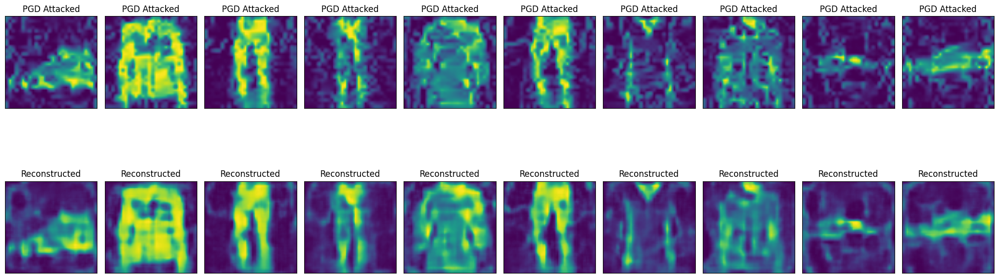

In [ ]:
# Test the reconstruction of the model adopts the linear increasing temperature strategy for training (with parallel models): model1
# The original images are attacked by high-intensity pgd attacks eps=0.5

# Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


def adjust_image_size(images, new_size=(28, 28)):
    resized_images = []
    for image in images:
        image = TF.to_pil_image(image)
        image = TF.resize(image, new_size)
        image = TF.to_tensor(image)
        resized_images.append(image)
    return torch.stack(resized_images)

epsilon = 0.5 # high intensity attack
alpha = 0.01
iterations = 40

adv_images = []
true_labels = []
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images_resized = adjust_image_size(images, new_size=(28, 28))
    adv_image = pgd_attack(cnn_model, images_resized, labels, epsilon, alpha, iterations)
    adv_image_resized = adjust_image_size(adv_image, new_size=(64, 64))

    adv_images.append(adv_image_resized)
    true_labels.append(labels)

adv_images = torch.cat(adv_images, dim=0)
true_labels = torch.cat(true_labels, dim=0)

model1 = model1.to(device)


plt.figure(figsize=(20, 8))
for i in range(10):

    ax = plt.subplot(2, 10, i + 1)
    plt.imshow(adv_images[i].cpu().detach().numpy().transpose(1, 2, 0))
    plt.title("PGD Attacked")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    image_on_device = adv_images[i].to(device).unsqueeze(0)
    reconstructed_image = model1(image_on_device)[0]
    ax = plt.subplot(2, 10, i + 11)
    plt.imshow(reconstructed_image[0].detach().cpu().numpy().transpose(1, 2, 0))
    plt.title("Reconstructed")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.tight_layout()
plt.show()


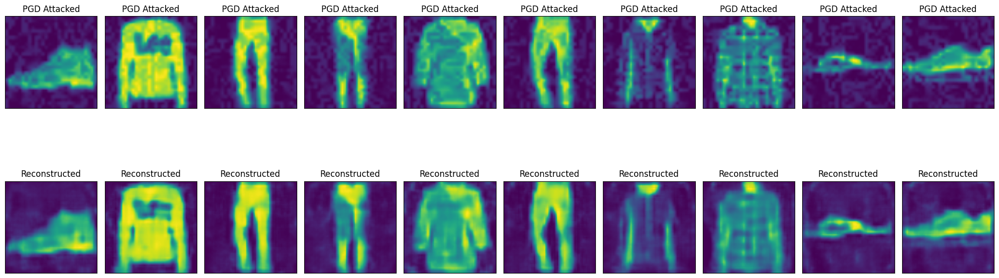

In [ ]:
# Test the reconstruction of the model adopts the linear increasing temperature strategy for training (with parallel models): model1
# The original images are attacked by middle-intensity pgd attacks eps=0.1

# Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


def adjust_image_size(images, new_size=(28, 28)):
    resized_images = []
    for image in images:
        image = TF.to_pil_image(image)
        image = TF.resize(image, new_size)
        image = TF.to_tensor(image)
        resized_images.append(image)
    return torch.stack(resized_images)

epsilon = 0.1
alpha = 0.01
iterations = 40

adv_images = []
true_labels = []
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)


    images_resized = adjust_image_size(images, new_size=(28, 28))


    adv_image = pgd_attack(cnn_model, images_resized, labels, epsilon, alpha, iterations)


    adv_image_resized = adjust_image_size(adv_image, new_size=(64, 64))

    adv_images.append(adv_image_resized)
    true_labels.append(labels)

adv_images = torch.cat(adv_images, dim=0)
true_labels = torch.cat(true_labels, dim=0)

model1 = model1.to(device)


plt.figure(figsize=(20, 8))
for i in range(10):

    ax = plt.subplot(2, 10, i + 1)
    plt.imshow(adv_images[i].cpu().detach().numpy().transpose(1, 2, 0))
    plt.title("PGD Attacked")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    image_on_device = adv_images[i].to(device).unsqueeze(0)
    reconstructed_image = model1(image_on_device)[0]
    ax = plt.subplot(2, 10, i + 11)
    plt.imshow(reconstructed_image[0].detach().cpu().numpy().transpose(1, 2, 0))
    plt.title("Reconstructed")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.tight_layout()
plt.show()


In [ ]:
# Trained a simple CNN model on fashion-MNIST
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.dropout = nn.Dropout(0.2)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


# Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

BATCH_SIZE = 64

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)

optimizer = optim.Adam(model.parameters(), lr=0.001)
def test_model(model, test_loader, epoch, best_accuracy):
    model.eval()
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
    accuracy = 100. * correct / len(test_loader.dataset)
    print(f"Epoch {epoch}, Test Accuracy: {accuracy:.2f}%")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        torch.save(model.state_dict(), 'best_CNN_modelfashionMNIST.pth')
        print(f"New best model saved with accuracy: {accuracy:.2f}%")
    return best_accuracy

def train_model(model, train_loader, optimizer, epoch):
    model.train()
    total_loss = 0
    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output, target)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Average Loss: {avg_loss:.4f}")

# Train for one epoch and test for best accuracy within the same loop
NUM_EPOCHS = 20
best_accuracy = 0.0

for epoch in range(NUM_EPOCHS):
    train_model(model, train_loader, optimizer, epoch)
    best_accuracy = test_model(model, test_loader, epoch+1, best_accuracy)


Epoch 1, Average Loss: 0.5037
Epoch 1, Test Accuracy: 86.59%
New best model saved with accuracy: 86.59%
Epoch 2, Average Loss: 0.3177
Epoch 2, Test Accuracy: 88.91%
New best model saved with accuracy: 88.91%
Epoch 3, Average Loss: 0.2691
Epoch 3, Test Accuracy: 89.87%
New best model saved with accuracy: 89.87%
Epoch 4, Average Loss: 0.2360
Epoch 4, Test Accuracy: 90.87%
New best model saved with accuracy: 90.87%
Epoch 5, Average Loss: 0.2098
Epoch 5, Test Accuracy: 90.43%
Epoch 6, Average Loss: 0.1869
Epoch 6, Test Accuracy: 91.51%
New best model saved with accuracy: 91.51%
Epoch 7, Average Loss: 0.1706
Epoch 7, Test Accuracy: 91.66%
New best model saved with accuracy: 91.66%
Epoch 8, Average Loss: 0.1568
Epoch 8, Test Accuracy: 91.88%
New best model saved with accuracy: 91.88%
Epoch 9, Average Loss: 0.1398
Epoch 9, Test Accuracy: 92.01%
New best model saved with accuracy: 92.01%
Epoch 10, Average Loss: 0.1283
Epoch 10, Test Accuracy: 92.24%
New best model saved with accuracy: 92.24%
E

In [ ]:
best_model_path = '/content/best_CNN_modelfashionMNIST.pth'
cnn_model = CNN().to(device)
cnn_model.load_state_dict(torch.load(best_model_path))
cnn_model.eval()

CNN(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=3136, out_features=128, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=10, bias=True)
)

In [ ]:
# test CNN on test dataset
def evaluate_accuracy(model, data_loader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            _, predicted = torch.max(output, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy


cnn_model = CNN().to(device)
cnn_model.load_state_dict(torch.load('best_CNN_modelfashionMNIST.pth'))

test_accuracy = evaluate_accuracy(cnn_model, test_loader)
print(f"Test Accuracy: {test_accuracy:.2f}%")


Test Accuracy: 92.31%


In [ ]:
# Test our model for anti-PGD attack

# Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)


def adjust_image_size(images, new_size=(28, 28)):
    resized_images = []
    for image in images:
        image = TF.to_pil_image(image)
        image = TF.resize(image, new_size)
        image = TF.to_tensor(image)
        resized_images.append(image)
    return torch.stack(resized_images)

epsilon = 0.2 # mid-intensity attack
alpha = 0.01
iterations = 40

adv_images = []
true_labels = []
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images_resized = adjust_image_size(images, new_size=(28, 28))
    adv_image = pgd_attack(cnn_model, images_resized, labels, epsilon, alpha, iterations)
    adv_image_resized = adjust_image_size(adv_image, new_size=(64, 64))
    adv_images.append(adv_image_resized)
    true_labels.append(labels)

adv_images = torch.cat(adv_images, dim=0)
true_labels = torch.cat(true_labels, dim=0)

model1 = model1.to(device)

def evaluate_classifier_on_reconstructed_images(cnn_model, vae_model, data_loader, device):
    cnn_model.eval()
    vae_model.eval()

    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            reconstructed_images, *_ = vae_model(images)
            reconstructed_images_resized = adjust_image_size(reconstructed_images, new_size=(28, 28))
            reconstructed_images_resized = reconstructed_images_resized.to(device)
            outputs = cnn_model(reconstructed_images_resized)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

accuracy = evaluate_classifier_on_reconstructed_images(cnn_model, model1, test_loader, device)
print(f"Accuracy of the CNN model on the reconstructed images: {accuracy:.2f}%")


Accuracy of the CNN model on the reconstructed images: 90.01%


In [ ]:
# PGD attack Download and load the MNIST dataset
train_dataset = datasets.FashionMNIST('./data', train=True, transform=transform, download=True)
test_dataset = datasets.FashionMNIST('./data', train=False, transform=transform, download=True)

# Create data loaders
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=BATCH_SIZE, num_workers=4, pin_memory=True)



def adjust_image_size(images, new_size=(28, 28)):
    resized_images = []
    for image in images:
        image = TF.to_pil_image(image)
        image = TF.resize(image, new_size)
        image = TF.to_tensor(image)
        resized_images.append(image)
    return torch.stack(resized_images)

epsilon = 0.9 # Very high-intensity attack
alpha = 0.01
iterations = 40

adv_images = []
true_labels = []
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images_resized = adjust_image_size(images, new_size=(28, 28))
    adv_image = pgd_attack(cnn_model, images_resized, labels, epsilon, alpha, iterations)
    adv_image_resized = adjust_image_size(adv_image, new_size=(64, 64))
    adv_images.append(adv_image_resized)
    true_labels.append(labels)

adv_images = torch.cat(adv_images, dim=0)
true_labels = torch.cat(true_labels, dim=0)

model1 = model1.to(device)

def evaluate_classifier_on_reconstructed_images(cnn_model, vae_model, data_loader, device):
    cnn_model.eval()
    vae_model.eval()

    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            reconstructed_images, *_ = vae_model(images)
            reconstructed_images_resized = adjust_image_size(reconstructed_images, new_size=(28, 28))
            reconstructed_images_resized = reconstructed_images_resized.to(device)
            outputs = cnn_model(reconstructed_images_resized)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

accuracy = evaluate_classifier_on_reconstructed_images(cnn_model, model1, test_loader, device)
print(f"Accuracy of the CNN model on the reconstructed images: {accuracy:.2f}%")


Accuracy of the CNN model on the reconstructed images: 67.58%
